# Multiclass U-net

## Import data

In [2]:
from google.colab import auth
auth.authenticate_user()

In [3]:
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')

In [4]:
testSetId = '1Gmb5aFWuR8kmfDjulgN2h90FutCxQVmF'
trainingSetId = '19vro2YKFiURqqmFGYYIx0ZDkirn4F9mk'
originalId = '16ibmmBvAYsw9ztlO6KpccQDAzvulEADX'
segmentedId = '1KAurcmqTNxD4ivXD2UNcfDYrfgi4BooZ'
binaryId = '1A1sT2-QNEYFvvjcRNSpwavSkTYRKbouY'
binaryMatId = '1AqMAZ7UujizxgijD1LvFs4qenqSZZ8fo'
segmentedMatId = '1a2BFzPPBYt703pStH3VAF8RzvlmiOoDa'
segmentedOnehotId = '16b1Xej2t3XqpyaaxJIa9VT0jsUurtXvY'
classesId = '1V34MJgrbcRkoZBFdI-JuVtyAVAx39Oac'
adamax_72Id = '1zJSfbeWX9b7NdOAcJZnsiUjGC5oAlYAd'

In [5]:
import io
from googleapiclient.http import MediaIoBaseDownload, MediaFileUpload

def importFromDrive(filename, nameId):
  request = drive_service.files().get_media(fileId=nameId)
  variable = io.FileIO(filename, 'wb')
  downloader = MediaIoBaseDownload(variable, request)
  done = False
  while done is False:
    # _ is a placeholder for a progress object that we ignore.
    # (Our file is small, so we skip reporting progress.)
    _, done = downloader.next_chunk()

  variable.seek(0)

In [6]:
importFromDrive('trainSet.mat', trainingSetId)
importFromDrive('testSet.mat', testSetId)
importFromDrive('original.zip', originalId)
importFromDrive('segmented_images.zip', segmentedId)
importFromDrive('classes.csv', '1V34MJgrbcRkoZBFdI-JuVtyAVAx39Oac')

#importFromDrive('segmented_mat.zip', segmentedMatId)
importFromDrive('segmented_onehot.zip', segmentedOnehotId)
importFromDrive('adamax_72.zip', adamax_72Id)

In [7]:
!rm -r data/original data/segmented_images data/binary_images data/segmented_mat data/binary_mat data/segmented_onehot
!unzip original.zip -d data/
!unzip segmented_images.zip -d data/
!unzip binary_images.zip -d data/
!unzip segmented_mat.zip -d data/
!unzip binary_mat.zip -d data
!unzip segmented_onehot.zip -d data/
!mkdir results_segmentation
!unzip adamax_72.zip -d results_segmentation

rm: cannot remove 'data/segmented_images': No such file or directory
rm: cannot remove 'data/segmented_mat': No such file or directory
Archive:  original.zip
   creating: data/original/
  inflating: data/original/20151127_114556.jpg  
  inflating: data/original/20151127_114946.jpg  
  inflating: data/original/20151127_115133.jpg  
  inflating: data/original/20151127_115151.jpg  
  inflating: data/original/20151127_115229.jpg  
  inflating: data/original/20151127_115424.jpg  
  inflating: data/original/20151127_115553.jpg  
  inflating: data/original/20151127_115951.jpg  
  inflating: data/original/20151127_120002.jpg  
  inflating: data/original/20151127_120128.jpg  
  inflating: data/original/20151127_120156.jpg  
  inflating: data/original/20151127_120208.jpg  
  inflating: data/original/20151127_120446.jpg  
  inflating: data/original/20151127_120643.jpg  
  inflating: data/original/20151127_120723.jpg  
  inflating: data/original/20151127_120755.jpg  
  inflating: data/original/201


  inflating: data/original/20151127_130448.jpg  
  inflating: data/original/20151127_130511.jpg  
  inflating: data/original/20151127_130604.jpg  
  inflating: data/original/20151127_130620.jpg  
  inflating: data/original/20151127_130638.jpg  
  inflating: data/original/20151127_130721.jpg  
  inflating: data/original/20151127_130733.jpg  
  inflating: data/original/20151127_130755.jpg  
  inflating: data/original/20151127_130819.jpg  
  inflating: data/original/20151127_130844.jpg  
  inflating: data/original/20151127_130936.jpg  
  inflating: data/original/20151127_131034.jpg  
  inflating: data/original/20151127_131055.jpg  
  inflating: data/original/20151127_131106.jpg  
  inflating: data/original/20151127_131130.jpg  
  inflating: data/original/20151127_131150.jpg  
  inflating: data/original/20151127_131209.jpg  
  inflating: data/original/20151127_131259.jpg  
  inflating: data/original/20151127_131420.jpg  
  inflating: data/original/20151127_131439.jpg  
  inflating: data/o


  inflating: data/original/20151127_141411.jpg  
  inflating: data/original/20151127_141457.jpg  
  inflating: data/original/20151127_141611.jpg  
  inflating: data/original/20151127_142112.jpg  
  inflating: data/original/20151127_142122.jpg  
  inflating: data/original/20151127_142522.jpg  
  inflating: data/original/20151127_142534.jpg  
  inflating: data/original/20151130_113406.jpg  
  inflating: data/original/20151130_113436.jpg  
  inflating: data/original/20151130_113525.jpg  
  inflating: data/original/20151130_113548.jpg  
  inflating: data/original/20151130_113559.jpg  
  inflating: data/original/20151130_113720.jpg  
  inflating: data/original/20151130_113729.jpg  
  inflating: data/original/20151130_113755.jpg  
  inflating: data/original/20151130_113811.jpg  
  inflating: data/original/20151130_114034.jpg  
  inflating: data/original/20151130_114050.jpg  
  inflating: data/original/20151130_114136.jpg  
  inflating: data/original/20151130_114152.jpg  
  inflating: data/o


  inflating: data/original/20151130_121642.jpg  
  inflating: data/original/20151130_121726.jpg  
  inflating: data/original/20151130_122101.jpg  
  inflating: data/original/20151130_122114.jpg  
  inflating: data/original/20151130_122130.jpg  
  inflating: data/original/20151130_122155.jpg  
  inflating: data/original/20151130_122203.jpg  
  inflating: data/original/20151130_122212.jpg  
  inflating: data/original/20151130_122225.jpg  
  inflating: data/original/20151130_122317.jpg  
  inflating: data/original/20151130_122328.jpg  
  inflating: data/original/20151130_122350.jpg  
  inflating: data/original/20151130_122401.jpg  
  inflating: data/original/20151130_122412.jpg  
  inflating: data/original/20151130_122518.jpg  
  inflating: data/original/20151130_122530.jpg  
  inflating: data/original/20151130_122541.jpg  
  inflating: data/original/20151203_121413.jpg  
  inflating: data/original/20151203_121442.jpg  
  inflating: data/original/20151203_121602.jpg  
  inflating: data/o


  inflating: data/original/20151204_113721.jpg  
  inflating: data/original/20151204_113756.jpg  
  inflating: data/original/20151204_113839.jpg  
  inflating: data/original/20151204_113847.jpg  
  inflating: data/original/20151204_113948.jpg  
  inflating: data/original/20151204_114130.jpg  
  inflating: data/original/20151204_114159.jpg  
  inflating: data/original/20151204_114550.jpg  
  inflating: data/original/20151204_114641.jpg  
  inflating: data/original/20151204_114754.jpg  
  inflating: data/original/20151204_114821.jpg  
  inflating: data/original/20151204_115038.jpg  
  inflating: data/original/20151204_115241.jpg  
  inflating: data/original/20151204_115301.jpg  
  inflating: data/original/20151204_115325.jpg  
  inflating: data/original/20151204_115413.jpg  
  inflating: data/original/20151204_115511.jpg  
  inflating: data/original/20151204_115551.jpg  
  inflating: data/original/20151204_115721.jpg  
  inflating: data/original/20151204_115814.jpg  
  inflating: data/o


  inflating: data/original/20151204_123427.jpg  
  inflating: data/original/20151204_123442.jpg  
  inflating: data/original/20151204_123503.jpg  
  inflating: data/original/20151204_123518.jpg  
  inflating: data/original/20151204_123539.jpg  
  inflating: data/original/20151204_123552.jpg  
  inflating: data/original/20151204_123621.jpg  
  inflating: data/original/20151204_123636.jpg  
  inflating: data/original/20151204_123706.jpg  
  inflating: data/original/20151204_123744.jpg  
  inflating: data/original/20151204_123807.jpg  
  inflating: data/original/20151204_123909.jpg  
  inflating: data/original/20151204_123929.jpg  
  inflating: data/original/20151204_123954.jpg  
  inflating: data/original/20151204_124018.jpg  
  inflating: data/original/20151204_124035.jpg  
  inflating: data/original/20151204_124117.jpg  
  inflating: data/original/20151204_124139.jpg  
  inflating: data/original/20151204_124157.jpg  
  inflating: data/original/20151204_124232.jpg  
  inflating: data/o


  inflating: data/original/20151204_133704.jpg  
  inflating: data/original/20151204_133719.jpg  
  inflating: data/original/20151204_133742.jpg  
  inflating: data/original/20151204_133802.jpg  
  inflating: data/original/20151204_133824.jpg  
  inflating: data/original/20151204_133856.jpg  
  inflating: data/original/20151204_133949.jpg  
  inflating: data/original/20151204_134222.jpg  
  inflating: data/original/20151204_134303.jpg  
  inflating: data/original/20151204_134339.jpg  
  inflating: data/original/20151204_134947.jpg  
  inflating: data/original/20151204_135227.jpg  
  inflating: data/original/20151204_135405.jpg  
  inflating: data/original/20151204_135424.jpg  
  inflating: data/original/20151211_113606.jpg  
  inflating: data/original/20151211_113626.jpg  
  inflating: data/original/20151211_113705.jpg  
  inflating: data/original/20151211_113730.jpg  
  inflating: data/original/20151211_113851.jpg  
  inflating: data/original/20151211_114703.jpg  
  inflating: data/o


  inflating: data/original/20151211_123227.jpg  
  inflating: data/original/20151211_123243.jpg  
  inflating: data/original/20151211_123320.jpg  
  inflating: data/original/20151211_123327.jpg  
  inflating: data/original/20151211_123402.jpg  
  inflating: data/original/20151211_123422.jpg  
  inflating: data/original/20151211_123449.jpg  
  inflating: data/original/20151211_123531.jpg  
  inflating: data/original/20151211_123601.jpg  
  inflating: data/original/20151211_123927.jpg  
  inflating: data/original/20151211_123958.jpg  
  inflating: data/original/20151211_124012.jpg  
  inflating: data/original/20151211_124046.jpg  
  inflating: data/original/20151211_124111.jpg  
  inflating: data/original/20151211_124145.jpg  
  inflating: data/original/20151211_124331.jpg  
  inflating: data/original/20151211_124402.jpg  
  inflating: data/original/20151211_124420.jpg  
  inflating: data/original/20151211_124526.jpg  
  inflating: data/original/20151211_124724.jpg  
  inflating: data/o


  inflating: data/original/20151211_133341.jpg  
  inflating: data/original/20151211_133414.jpg  
  inflating: data/original/20151211_133450.jpg  
  inflating: data/original/20151211_133507.jpg  
  inflating: data/original/20151211_133643.jpg  
  inflating: data/original/20151211_133751.jpg  
  inflating: data/original/20151211_133922.jpg  
  inflating: data/original/20151211_134033.jpg  
  inflating: data/original/20151211_134059.jpg  
  inflating: data/original/20151211_134119.jpg  
  inflating: data/original/20151211_134332.jpg  
  inflating: data/original/20151211_134345.jpg  
  inflating: data/original/20151211_134530.jpg  
  inflating: data/original/20151211_134539.jpg  
  inflating: data/original/20151211_134607.jpg  
  inflating: data/original/20151211_134625.jpg  
  inflating: data/original/20151211_134640.jpg  
  inflating: data/original/20151211_134652.jpg  
  inflating: data/original/20151211_134749.jpg  
  inflating: data/original/20151211_134835.jpg  
  inflating: data/o


  inflating: data/original/20151221_120138.jpg  
  inflating: data/original/20151221_120249.jpg  
  inflating: data/original/20151221_120310.jpg  
  inflating: data/original/20151221_120329.jpg  
  inflating: data/original/20151221_120416.jpg  
  inflating: data/original/20151221_120449.jpg  
  inflating: data/original/20151221_120510.jpg  
  inflating: data/original/20151221_120520.jpg  
  inflating: data/original/20151221_120547.jpg  
  inflating: data/original/20151221_120613.jpg  
  inflating: data/original/20151221_120655.jpg  
  inflating: data/original/20151221_120721.jpg  
  inflating: data/original/20151221_120823.jpg  
  inflating: data/original/20151221_120851.jpg  
  inflating: data/original/20151221_120908.jpg  
  inflating: data/original/20151221_121027.jpg  
  inflating: data/original/20151221_121055.jpg  
  inflating: data/original/20151221_121111.jpg  
  inflating: data/original/20151221_121132.jpg  
  inflating: data/original/20151221_121154.jpg  
  inflating: data/o


  inflating: data/original/20151221_125840.jpg  
  inflating: data/original/20151221_125851.jpg  
  inflating: data/original/20151221_125935.jpg  
  inflating: data/original/20151221_125957.jpg  
  inflating: data/original/20151221_130014.jpg  
  inflating: data/original/20151221_130026.jpg  
  inflating: data/original/20151221_130046.jpg  
  inflating: data/original/20151221_130104.jpg  
  inflating: data/original/20151221_130150.jpg  
  inflating: data/original/20151221_130824.jpg  
  inflating: data/original/20151221_130901.jpg  
  inflating: data/original/20151221_130923.jpg  
  inflating: data/original/20151221_130948.jpg  
  inflating: data/original/20151221_131046.jpg  
  inflating: data/original/20151221_131143.jpg  
  inflating: data/original/20151221_131207.jpg  
  inflating: data/original/20151221_131230.jpg  
  inflating: data/original/20151221_131301.jpg  
  inflating: data/original/20151221_131317.jpg  
  inflating: data/original/20151221_131353.jpg  
  inflating: data/o

  inflating: data/segmented_images/20151127_131852.png  
  inflating: data/segmented_images/20151127_131933.png  
  inflating: data/segmented_images/20151127_131948.png  
  inflating: data/segmented_images/20151127_132002.png  
  inflating: data/segmented_images/20151127_132024.png  
  inflating: data/segmented_images/20151127_132109.png  
  inflating: data/segmented_images/20151127_132136.png  
  inflating: data/segmented_images/20151127_132235.png  
  inflating: data/segmented_images/20151127_132317.png  
  inflating: data/segmented_images/20151127_132413.png  
  inflating: data/segmented_images/20151127_132519.png  
  inflating: data/segmented_images/20151127_132537.png  
  inflating: data/segmented_images/20151127_132650.png  
  inflating: data/segmented_images/20151127_132700.png  
  inflating: data/segmented_images/20151127_132740.png  
  inflating: data/segmented_images/20151127_132824.png  
  inflating: data/segmented_images/20151127_132859.png  
  inflating: data/segmented_ima

  inflating: data/segmented_images/20151204_133259.png  
  inflating: data/segmented_images/20151204_133312.png  
  inflating: data/segmented_images/20151204_133346.png  
  inflating: data/segmented_images/20151204_133409.png  
  inflating: data/segmented_images/20151204_133423.png  
  inflating: data/segmented_images/20151204_133446.png  
  inflating: data/segmented_images/20151204_133511.png  
  inflating: data/segmented_images/20151204_133527.png  
  inflating: data/segmented_images/20151204_133543.png  
  inflating: data/segmented_images/20151204_133650.png  
  inflating: data/segmented_images/20151204_133704.png  
  inflating: data/segmented_images/20151204_133719.png  
  inflating: data/segmented_images/20151204_133742.png  
  inflating: data/segmented_images/20151204_133802.png  
  inflating: data/segmented_images/20151204_133824.png  
  inflating: data/segmented_images/20151204_133856.png  
  inflating: data/segmented_images/20151204_133949.png  
  inflating: data/segmented_ima

Archive:  binary_images.zip
   creating: data/binary_images/
  inflating: data/binary_images/20151127_114556.png  
  inflating: data/binary_images/20151127_114946.png  
  inflating: data/binary_images/20151127_115133.png  
  inflating: data/binary_images/20151127_115151.png  
  inflating: data/binary_images/20151127_115229.png  
  inflating: data/binary_images/20151127_115424.png  
  inflating: data/binary_images/20151127_115553.png  
  inflating: data/binary_images/20151127_115951.png  
  inflating: data/binary_images/20151127_120002.png  
  inflating: data/binary_images/20151127_120128.png  
  inflating: data/binary_images/20151127_120156.png  
  inflating: data/binary_images/20151127_120208.png  
  inflating: data/binary_images/20151127_120446.png  
  inflating: data/binary_images/20151127_120643.png  
  inflating: data/binary_images/20151127_120723.png  
  inflating: data/binary_images/20151127_120755.png  
  inflating: data/binary_images/20151127_120831.png  
  inflating: data/bin


  inflating: data/binary_images/20151204_123636.png  
  inflating: data/binary_images/20151204_123706.png  
  inflating: data/binary_images/20151204_123744.png  
  inflating: data/binary_images/20151204_123807.png  
  inflating: data/binary_images/20151204_123909.png  
  inflating: data/binary_images/20151204_123929.png  
  inflating: data/binary_images/20151204_123954.png  
  inflating: data/binary_images/20151204_124018.png  
  inflating: data/binary_images/20151204_124035.png  
  inflating: data/binary_images/20151204_124117.png  
  inflating: data/binary_images/20151204_124139.png  
  inflating: data/binary_images/20151204_124157.png  
  inflating: data/binary_images/20151204_124232.png  
  inflating: data/binary_images/20151204_124301.png  
  inflating: data/binary_images/20151204_124358.png  
  inflating: data/binary_images/20151204_124402.png  
  inflating: data/binary_images/20151204_124439.png  
  inflating: data/binary_images/20151204_124547.png  
  inflating: data/binary_im


  inflating: data/binary_images/20151221_134206.png  
  inflating: data/binary_images/20151221_134224.png  
  inflating: data/binary_images/20151221_134253.png  
  inflating: data/binary_images/20151221_134329.png  
  inflating: data/binary_images/20151221_134431.png  
  inflating: data/binary_images/20151221_134533.png  
  inflating: data/binary_images/20151221_134624.png  
  inflating: data/binary_images/20151221_134638.png  
  inflating: data/binary_images/20151221_134656.png  
  inflating: data/binary_images/20151221_134720.png  
  inflating: data/binary_images/20151221_134746.png  
  inflating: data/binary_images/20151221_134800.png  
  inflating: data/binary_images/20151221_134839.png  
  inflating: data/binary_images/20151221_134925.png  
  inflating: data/binary_images/20151221_134946.png  
  inflating: data/binary_images/20151221_135001.png  
  inflating: data/binary_images/20151221_135010.png  
  inflating: data/binary_images/20151221_135021.png  
  inflating: data/binary_im


  inflating: data/segmented_mat/20151127_133704.mat  
  inflating: data/segmented_mat/20151127_133813.mat  
  inflating: data/segmented_mat/20151127_133941.mat  
  inflating: data/segmented_mat/20151127_134045.mat  
  inflating: data/segmented_mat/20151127_134113.mat  
  inflating: data/segmented_mat/20151127_134151.mat  
  inflating: data/segmented_mat/20151127_134203.mat  
  inflating: data/segmented_mat/20151127_134243.mat  
  inflating: data/segmented_mat/20151127_134327.mat  
  inflating: data/segmented_mat/20151127_134433.mat  
  inflating: data/segmented_mat/20151127_134537.mat  
  inflating: data/segmented_mat/20151127_134546.mat  
  inflating: data/segmented_mat/20151127_134617.mat  
  inflating: data/segmented_mat/20151127_134630.mat  
  inflating: data/segmented_mat/20151127_134710.mat  
  inflating: data/segmented_mat/20151127_134804.mat  
  inflating: data/segmented_mat/20151127_134854.mat  
  inflating: data/segmented_mat/20151127_134910.mat  
  inflating: data/segmented


  inflating: data/segmented_mat/20151203_124501.mat  
  inflating: data/segmented_mat/20151203_124558.mat  
  inflating: data/segmented_mat/20151203_124615.mat  
  inflating: data/segmented_mat/20151203_124649.mat  
  inflating: data/segmented_mat/20151203_124659.mat  
  inflating: data/segmented_mat/20151203_124739.mat  
  inflating: data/segmented_mat/20151203_124827.mat  
  inflating: data/segmented_mat/20151203_124903.mat  
  inflating: data/segmented_mat/20151203_124923.mat  
  inflating: data/segmented_mat/20151203_125059.mat  
  inflating: data/segmented_mat/20151203_125110.mat  
  inflating: data/segmented_mat/20151203_125225.mat  
  inflating: data/segmented_mat/20151203_125246.mat  
  inflating: data/segmented_mat/20151203_125258.mat  
  inflating: data/segmented_mat/20151203_125317.mat  
  inflating: data/segmented_mat/20151203_125620.mat  
  inflating: data/segmented_mat/20151203_125638.mat  
  inflating: data/segmented_mat/20151203_125657.mat  
  inflating: data/segmented


  inflating: data/segmented_mat/20151204_123744.mat  
  inflating: data/segmented_mat/20151204_123807.mat  
  inflating: data/segmented_mat/20151204_123909.mat  
  inflating: data/segmented_mat/20151204_123929.mat  
  inflating: data/segmented_mat/20151204_123954.mat  
  inflating: data/segmented_mat/20151204_124018.mat  
  inflating: data/segmented_mat/20151204_124035.mat  
  inflating: data/segmented_mat/20151204_124117.mat  
  inflating: data/segmented_mat/20151204_124139.mat  
  inflating: data/segmented_mat/20151204_124157.mat  
  inflating: data/segmented_mat/20151204_124232.mat  
  inflating: data/segmented_mat/20151204_124301.mat  
  inflating: data/segmented_mat/20151204_124358.mat  
  inflating: data/segmented_mat/20151204_124402.mat  
  inflating: data/segmented_mat/20151204_124439.mat  
  inflating: data/segmented_mat/20151204_124547.mat  
  inflating: data/segmented_mat/20151204_124602.mat  
  inflating: data/segmented_mat/20151204_124622.mat  
  inflating: data/segmented


  inflating: data/segmented_mat/20151211_122508.mat  
  inflating: data/segmented_mat/20151211_122524.mat  
  inflating: data/segmented_mat/20151211_122610.mat  
  inflating: data/segmented_mat/20151211_122634.mat  
  inflating: data/segmented_mat/20151211_122648.mat  
  inflating: data/segmented_mat/20151211_122741.mat  
  inflating: data/segmented_mat/20151211_122813.mat  
  inflating: data/segmented_mat/20151211_123004.mat  
  inflating: data/segmented_mat/20151211_123024.mat  
  inflating: data/segmented_mat/20151211_123134.mat  
  inflating: data/segmented_mat/20151211_123227.mat  
  inflating: data/segmented_mat/20151211_123243.mat  
  inflating: data/segmented_mat/20151211_123320.mat  
  inflating: data/segmented_mat/20151211_123327.mat  
  inflating: data/segmented_mat/20151211_123402.mat  
  inflating: data/segmented_mat/20151211_123422.mat  
  inflating: data/segmented_mat/20151211_123449.mat  
  inflating: data/segmented_mat/20151211_123531.mat  
  inflating: data/segmented


  inflating: data/segmented_mat/20151211_142954.mat  
  inflating: data/segmented_mat/20151211_143008.mat  
  inflating: data/segmented_mat/20151221_113328.mat  
  inflating: data/segmented_mat/20151221_113350.mat  
  inflating: data/segmented_mat/20151221_113404.mat  
  inflating: data/segmented_mat/20151221_113425.mat  
  inflating: data/segmented_mat/20151221_113511.mat  
  inflating: data/segmented_mat/20151221_113608.mat  
  inflating: data/segmented_mat/20151221_113726.mat  
  inflating: data/segmented_mat/20151221_113855.mat  
  inflating: data/segmented_mat/20151221_114009.mat  
  inflating: data/segmented_mat/20151221_114335.mat  
  inflating: data/segmented_mat/20151221_114354.mat  
  inflating: data/segmented_mat/20151221_114406.mat  
  inflating: data/segmented_mat/20151221_114415.mat  
  inflating: data/segmented_mat/20151221_114428.mat  
  inflating: data/segmented_mat/20151221_114603.mat  
  inflating: data/segmented_mat/20151221_114732.mat  
  inflating: data/segmented


  inflating: data/segmented_mat/20151221_132837.mat  
  inflating: data/segmented_mat/20151221_132902.mat  
  inflating: data/segmented_mat/20151221_132936.mat  
  inflating: data/segmented_mat/20151221_133105.mat  
  inflating: data/segmented_mat/20151221_133353.mat  
  inflating: data/segmented_mat/20151221_133513.mat  
  inflating: data/segmented_mat/20151221_133608.mat  
  inflating: data/segmented_mat/20151221_133613.mat  
  inflating: data/segmented_mat/20151221_133631.mat  
  inflating: data/segmented_mat/20151221_133737.mat  
  inflating: data/segmented_mat/20151221_133808.mat  
  inflating: data/segmented_mat/20151221_133902.mat  
  inflating: data/segmented_mat/20151221_133928.mat  
  inflating: data/segmented_mat/20151221_133957.mat  
  inflating: data/segmented_mat/20151221_134018.mat  
  inflating: data/segmented_mat/20151221_134043.mat  
  inflating: data/segmented_mat/20151221_134106.mat  
  inflating: data/segmented_mat/20151221_134140.mat  
  inflating: data/segmented


  inflating: data/binary_mat/20151130_120455.mat  
  inflating: data/binary_mat/20151130_120839.mat  
  inflating: data/binary_mat/20151130_120943.mat  
  inflating: data/binary_mat/20151130_120958.mat  
  inflating: data/binary_mat/20151130_121105.mat  
  inflating: data/binary_mat/20151130_121124.mat  
  inflating: data/binary_mat/20151130_121144.mat  
  inflating: data/binary_mat/20151130_121212.mat  
  inflating: data/binary_mat/20151130_121224.mat  
  inflating: data/binary_mat/20151130_121249.mat  
  inflating: data/binary_mat/20151130_121302.mat  
  inflating: data/binary_mat/20151130_121320.mat  
  inflating: data/binary_mat/20151130_121343.mat  
  inflating: data/binary_mat/20151130_121353.mat  
  inflating: data/binary_mat/20151130_121414.mat  
  inflating: data/binary_mat/20151130_121453.mat  
  inflating: data/binary_mat/20151130_121522.mat  
  inflating: data/binary_mat/20151130_121536.mat  
  inflating: data/binary_mat/20151130_121548.mat  
  inflating: data/binary_mat/2


  inflating: data/binary_mat/20151211_120041.mat  
  inflating: data/binary_mat/20151211_120113.mat  
  inflating: data/binary_mat/20151211_120144.mat  
  inflating: data/binary_mat/20151211_120211.mat  
  inflating: data/binary_mat/20151211_120256.mat  
  inflating: data/binary_mat/20151211_120311.mat  
  inflating: data/binary_mat/20151211_120328.mat  
  inflating: data/binary_mat/20151211_120336.mat  
  inflating: data/binary_mat/20151211_120352.mat  
  inflating: data/binary_mat/20151211_120432.mat  
  inflating: data/binary_mat/20151211_120606.mat  
  inflating: data/binary_mat/20151211_120626.mat  
  inflating: data/binary_mat/20151211_120710.mat  
  inflating: data/binary_mat/20151211_120725.mat  
  inflating: data/binary_mat/20151211_120752.mat  
  inflating: data/binary_mat/20151211_120803.mat  
  inflating: data/binary_mat/20151211_120836.mat  
  inflating: data/binary_mat/20151211_120859.mat  
  inflating: data/binary_mat/20151211_120915.mat  
  inflating: data/binary_mat/2


  inflating: data/binary_mat/20151221_130923.mat  
  inflating: data/binary_mat/20151221_130948.mat  
  inflating: data/binary_mat/20151221_131046.mat  
  inflating: data/binary_mat/20151221_131143.mat  
  inflating: data/binary_mat/20151221_131207.mat  
  inflating: data/binary_mat/20151221_131230.mat  
  inflating: data/binary_mat/20151221_131301.mat  
  inflating: data/binary_mat/20151221_131317.mat  
  inflating: data/binary_mat/20151221_131353.mat  
  inflating: data/binary_mat/20151221_131407.mat  
  inflating: data/binary_mat/20151221_131432.mat  
  inflating: data/binary_mat/20151221_131502.mat  
  inflating: data/binary_mat/20151221_131526.mat  
  inflating: data/binary_mat/20151221_131543.mat  
  inflating: data/binary_mat/20151221_131604.mat  
  inflating: data/binary_mat/20151221_131723.mat  
  inflating: data/binary_mat/20151221_131743.mat  
  inflating: data/binary_mat/20151221_131824.mat  
  inflating: data/binary_mat/20151221_131909.mat  
  inflating: data/binary_mat/2


  inflating: data/segmented_onehot/20151127_131751/pere.png  
   creating: data/segmented_onehot/20151127_131812/
  inflating: data/segmented_onehot/20151127_131812/carote.png  
  inflating: data/segmented_onehot/20151127_131812/fagiolini.png  
  inflating: data/segmented_onehot/20151127_131812/pasta_mare_e_monti.png  
  inflating: data/segmented_onehot/20151127_131812/pesce_(filetto).png  
   creating: data/segmented_onehot/20151127_131828/
  inflating: data/segmented_onehot/20151127_131828/carote.png  
  inflating: data/segmented_onehot/20151127_131828/fagiolini.png  
  inflating: data/segmented_onehot/20151127_131828/pane.png  
  inflating: data/segmented_onehot/20151127_131828/pasta_mare_e_monti.png  
  inflating: data/segmented_onehot/20151127_131828/torta_salata_spinaci_e_ricotta.png  
  inflating: data/segmented_onehot/20151127_131828/yogurt.png  
   creating: data/segmented_onehot/20151127_131839/
  inflating: data/segmented_onehot/20151127_131839/arancia.png  
  inflating: da

  inflating: data/segmented_onehot/20151130_115806/yogurt.png  
   creating: data/segmented_onehot/20151130_115848/
  inflating: data/segmented_onehot/20151130_115848/piselli.png  
  inflating: data/segmented_onehot/20151130_115848/riso_bianco.png  
   creating: data/segmented_onehot/20151130_115924/
  inflating: data/segmented_onehot/20151130_115924/finocchi_in_umido.png  
  inflating: data/segmented_onehot/20151130_115924/pasta_ricotta_e_salsiccia.png  
  inflating: data/segmented_onehot/20151130_115924/torta_salata_spinaci_e_ricotta.png  
   creating: data/segmented_onehot/20151130_115939/
  inflating: data/segmented_onehot/20151130_115939/arancia.png  
  inflating: data/segmented_onehot/20151130_115939/finocchi_in_umido.png  
  inflating: data/segmented_onehot/20151130_115939/passato_alla_piemontese.png  
  inflating: data/segmented_onehot/20151130_115939/pizza.png  
   creating: data/segmented_onehot/20151130_115950/
  inflating: data/segmented_onehot/20151130_115950/merluzzo_alle

  inflating: data/segmented_onehot/20151203_131227/pizza.png  
   creating: data/segmented_onehot/20151203_131252/
  inflating: data/segmented_onehot/20151203_131252/crema_zucca_e_fagioli.png  
  inflating: data/segmented_onehot/20151203_131252/pane.png  
  inflating: data/segmented_onehot/20151203_131252/patatine_fritte.png  
  inflating: data/segmented_onehot/20151203_131252/pere.png  
  inflating: data/segmented_onehot/20151203_131252/stinco_di_maiale.png  
   creating: data/segmented_onehot/20151203_131320/
  inflating: data/segmented_onehot/20151203_131320/pizza.png  
  inflating: data/segmented_onehot/20151203_131320/zucchine_umido.png  
   creating: data/segmented_onehot/20151203_131339/
  inflating: data/segmented_onehot/20151203_131339/arancia.png  
  inflating: data/segmented_onehot/20151203_131339/carote.png  
  inflating: data/segmented_onehot/20151203_131339/guazzetto_di_calamari.png  
  inflating: data/segmented_onehot/20151203_131339/pasta_sugo.png  
   creating: data/se

  inflating: data/segmented_onehot/20151204_132306/arrosto_di_vitello.png  
  inflating: data/segmented_onehot/20151204_132306/budino.png  
  inflating: data/segmented_onehot/20151204_132306/orecchiette_(ragu).png  
  inflating: data/segmented_onehot/20151204_132306/spinaci.png  
   creating: data/segmented_onehot/20151204_132341/
  inflating: data/segmented_onehot/20151204_132341/budino.png  
  inflating: data/segmented_onehot/20151204_132341/pane.png  
  inflating: data/segmented_onehot/20151204_132341/pasta_pancetta_e_zucchine.png  
  inflating: data/segmented_onehot/20151204_132341/spinaci.png  
  inflating: data/segmented_onehot/20151204_132341/torta_salata_(alla_valdostana).png  
   creating: data/segmented_onehot/20151204_132424/
  inflating: data/segmented_onehot/20151204_132424/arrosto_di_vitello.png  
  inflating: data/segmented_onehot/20151204_132424/pasta_pancetta_e_zucchine.png  
   creating: data/segmented_onehot/20151204_132509/
  inflating: data/segmented_onehot/2015120


   creating: data/segmented_onehot/20151211_124331/
  inflating: data/segmented_onehot/20151211_124331/riso_bianco.png  
  inflating: data/segmented_onehot/20151211_124331/yogurt.png  
   creating: data/segmented_onehot/20151211_124402/
  inflating: data/segmented_onehot/20151211_124402/fagiolini.png  
  inflating: data/segmented_onehot/20151211_124402/riso_bianco.png  
   creating: data/segmented_onehot/20151211_124420/
  inflating: data/segmented_onehot/20151211_124420/arancia.png  
  inflating: data/segmented_onehot/20151211_124420/pane.png  
  inflating: data/segmented_onehot/20151211_124420/pesce_2_(filetto).png  
  inflating: data/segmented_onehot/20151211_124420/riso_sugo.png  
  inflating: data/segmented_onehot/20151211_124420/spinaci.png  
   creating: data/segmented_onehot/20151211_124526/
  inflating: data/segmented_onehot/20151211_124526/pane.png  
  inflating: data/segmented_onehot/20151211_124526/pasta_e_fagioli.png  
   creating: data/segmented_onehot/20151211_124724/
 


  inflating: data/segmented_onehot/20151211_143008/zucchine_umido.png  
   creating: data/segmented_onehot/20151221_113328/
  inflating: data/segmented_onehot/20151221_113328/pasta_bianco.png  
   creating: data/segmented_onehot/20151221_113350/
  inflating: data/segmented_onehot/20151221_113350/budino.png  
  inflating: data/segmented_onehot/20151221_113350/carote.png  
  inflating: data/segmented_onehot/20151221_113350/pane.png  
  inflating: data/segmented_onehot/20151221_113350/pasta_sugo_pesce.png  
  inflating: data/segmented_onehot/20151221_113350/polpette_di_carne.png  
   creating: data/segmented_onehot/20151221_113404/
  inflating: data/segmented_onehot/20151221_113404/budino.png  
  inflating: data/segmented_onehot/20151221_113404/carote.png  
  inflating: data/segmented_onehot/20151221_113404/pasta_sugo_pesce.png  
  inflating: data/segmented_onehot/20151221_113404/scaloppine.png  
   creating: data/segmented_onehot/20151221_113425/
  inflating: data/segmented_onehot/20151

  inflating: data/segmented_onehot/20151221_131723/carote.png  
  inflating: data/segmented_onehot/20151221_131723/pane.png  
  inflating: data/segmented_onehot/20151221_131723/pasta_sugo_vegetariano.png  
  inflating: data/segmented_onehot/20151221_131723/pere.png  
  inflating: data/segmented_onehot/20151221_131723/polpette_di_carne.png  
   creating: data/segmented_onehot/20151221_131743/
  inflating: data/segmented_onehot/20151221_131743/carote.png  
  inflating: data/segmented_onehot/20151221_131743/pane.png  
  inflating: data/segmented_onehot/20151221_131743/pasta_sugo_pesce.png  
  inflating: data/segmented_onehot/20151221_131743/yogurt.png  
   creating: data/segmented_onehot/20151221_131824/
  inflating: data/segmented_onehot/20151221_131824/carote.png  
  inflating: data/segmented_onehot/20151221_131824/pane.png  
  inflating: data/segmented_onehot/20151221_131824/polpette_di_carne.png  
  inflating: data/segmented_onehot/20151221_131824/riso_bianco.png  
  inflating: data/s

  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/24.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_114733/31.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/72.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/17.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/2.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/28.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/49.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/32.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/12.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114733/19.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_114733/37.png  
  inflating

   creating: results_segmentation/results_segmentation/adamax_72/20151204_120630/
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/60.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/44.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_120630/41.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/69.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120630/13.png  
  inflating: results

  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/59.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/58.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_135603/27.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/18.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/29.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/64.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_135603/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/39.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135603/42.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125246/44.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125246/41.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125246/69.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_125246/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125246/71.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_125246/7.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_125246/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125246/13.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125246/33.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_125246/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125246/1.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/11.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/14.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/22.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/35.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_131933/54.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/0.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_131933/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_131933/48.png  
  inflatin


  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/1.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/34.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/16.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/9.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/26.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/68.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/5.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133643/59.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_133643/58.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/14.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/22.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/35.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/54.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/0.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133130/45.png  
  inflatin

  inflating: results_segmentation/results_segmentation/adamax_72/20151203_130958/1.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_130958/34.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_130958/16.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_130958/61.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_130958/9.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_130958/26.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_130958/68.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_130958/5.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_130958/59.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_130958/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_130958/27.png  
 extracting: 


   creating: results_segmentation/results_segmentation/adamax_72/20151204_134947/
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/60.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/44.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/41.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/69.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_134947/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_134947/13.png  
  inflating: result

  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/26.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/68.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/5.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/59.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/27.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_120859/3.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_120859/18.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/29.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/64.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_120859/8.png  
  inflating: 


  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/16.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/9.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_125657/26.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/68.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_125657/5.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/59.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/27.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_125657/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_125657/18.png  
  inflating:

 
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/0.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/53.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_134546/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/45.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_134546/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/38.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/52.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_134546/56.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_134546/20.png  
  inflati


  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/0.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/45.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/38.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/52.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_113606/56.png  
  inflatin


  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/30.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_120259/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/45.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/38.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_120259/52.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/56.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/20.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_120259/43.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_120259/55.png  
  inflati

  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/64.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/39.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/42.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/46.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/10.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/57.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/6.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/24.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121205/31.png  
  inflating:

  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/16.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_130651/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/9.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/26.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/68.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_130651/5.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/59.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/27.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_130651/18.png  
  inflating: 


  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/10.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/57.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/6.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/24.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/31.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/72.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/17.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_115730/2.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/28.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/49.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_115730/32.png  
 extracting

 extracting: results_segmentation/results_segmentation/adamax_72/20151221_135231/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/13.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/33.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/1.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/34.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_135231/16.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_135231/9.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_135231/26.png  
  inflating: 


  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/36.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/11.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/14.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/22.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/35.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/54.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_114603/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/63.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_114603/0.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114603/53.png  
  inflatin

  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/39.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/42.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/46.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/10.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/57.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/6.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/24.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/31.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_114552/72.png  
  inflating:

inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/42.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/46.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/10.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_135305/57.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/6.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/24.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/31.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/72.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/17.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_135305/2.png  
  inflating: r

  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/42.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/46.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/10.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/57.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/6.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/24.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/31.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/72.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/17.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_115645/2.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/49.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/32.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/12.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/19.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/37.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_120416/62.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/70.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/40.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/15.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/36.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120416/11.png  
  inflati


  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/59.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/58.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_121323/27.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/18.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_121323/29.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/64.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_121323/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/39.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121323/42.png  
  inflating

  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/5.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/59.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_121953/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/27.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/18.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_121953/29.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/64.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/39.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121953/25.png  
  inflating: 


  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/54.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/0.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/30.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_131512/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/45.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/38.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_131512/52.png  
  inflatin


 extracting: results_segmentation/results_segmentation/adamax_72/20151221_121132/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/13.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_121132/33.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/1.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/34.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/16.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121132/9.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/69.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/13.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/33.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_131101/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/1.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/34.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_131101/16.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/29.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/64.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/39.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/42.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/46.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/10.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/57.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/6.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121536/24.png  
  inflating


  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/16.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/9.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/26.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/68.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/5.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/59.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_133630/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/27.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_133630/18.png  
  inflating:

  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/68.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/5.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_115413/59.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_115413/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/27.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/18.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/29.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/64.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_115413/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_115413/39.png  
  inflating: 


  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/62.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/70.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/40.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_121353/15.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/36.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/11.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_121353/14.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151130_121353/22.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/35.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/54.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_121353/21.png  
  inflati


  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121252/52.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121252/56.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121252/20.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_121252/43.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121252/55.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121252/51.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121252/23.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_121252/67.png  
   creating: results_segmentation/results_segmentation/adamax_72/20151221_120655/
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120655/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_120655/60.png  
  inflating: resu

  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/54.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/0.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_122408/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/53.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_122408/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/45.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/47.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_122408/38.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_122408/52.png  
  inflating

  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/60.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/44.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_124309/41.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/69.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/65.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_124309/13.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_124309/33.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/38.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/52.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/56.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/20.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/43.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/55.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/51.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/23.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132617/67.png  
   creating: results_segmentation/results_segmentation/adamax_72/20151211_132304/
  inflating: resu

   creating: results_segmentation/results_segmentation/adamax_72/20151204_114159/
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/60.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/44.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/41.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/69.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_114159/13.png  
  inflating: results

  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/69.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/13.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/33.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/1.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/34.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151130_113525/16.png  
  inflating: 

  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121306/20.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121306/43.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121306/55.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121306/51.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121306/23.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_121306/67.png  
   creating: results_segmentation/results_segmentation/adamax_72/20151204_121059/
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121059/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121059/60.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121059/44.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121059/41.png  
  inflating: resul

 extracting: results_segmentation/results_segmentation/adamax_72/20151211_124814/56.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_124814/20.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_124814/43.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_124814/55.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_124814/51.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_124814/23.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_124814/67.png  
   creating: results_segmentation/results_segmentation/adamax_72/20151221_132837/
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132837/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_132837/60.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_132837/44.png  
  inflating: resul

  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/13.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/33.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/1.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/34.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/16.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_141852/9.png  
  inflating: 

 inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/54.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_121602/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/0.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/45.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/38.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_121602/52.png  
  inflating:


  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/54.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/0.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/48.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/45.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_120701/38.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_120701/52.png  
  inflatin


  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/65.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/13.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/33.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_131110/50.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/1.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/34.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_131110/16.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151203_131110/61.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151203_131110/9.png  
  inflating:


 extracting: results_segmentation/results_segmentation/adamax_72/20151221_131723/70.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/40.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/15.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/36.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/11.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/14.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_131723/22.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/35.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151221_131723/54.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151221_131723/63.png  
  inflati


  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/11.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/14.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_123358/22.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/35.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/54.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_123358/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/63.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/0.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151204_123358/30.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/53.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151204_123358/48.png  
  inflatin

  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/70.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/40.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/15.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/36.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/11.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/14.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/22.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_130733/35.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_130733/54.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_130733/21.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_130733/63.png  
  inflatin


 extracting: results_segmentation/results_segmentation/adamax_72/20151211_133334/24.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133334/31.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133334/72.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_133334/17.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133334/2.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_133334/28.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133334/49.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133334/32.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_133334/12.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_133334/19.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_133334/37.png  
  inflatin


 extracting: results_segmentation/results_segmentation/adamax_72/20151127_142522/47.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_142522/38.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_142522/52.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_142522/56.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_142522/20.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151127_142522/43.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_142522/55.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_142522/51.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_142522/23.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151127_142522/67.png  
   creating: results_segmentation/results_segmentation/adamax_72/20151130_120343/
  inflating: resu


  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/58.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/27.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/3.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/18.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/29.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/64.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_132154/8.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/39.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/25.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_132154/42.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_132154/46.png  
 extracting

  inflating: results_segmentation/results_segmentation/adamax_72/20151204_113721/67.png  
   creating: results_segmentation/results_segmentation/adamax_72/20151211_140411/
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/66.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/60.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/44.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/41.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/69.png  
 extracting: results_segmentation/results_segmentation/adamax_72/20151211_140411/4.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/71.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/7.png  
  inflating: results_segmentation/results_segmentation/adamax_72/20151211_140411/65.png  
  inflating: results

## Read data

In [8]:
import os
import random
import sys
import warnings
import numpy as np
import pandas as pd
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from keras.utils import Progbar

from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose,Convolution2D
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras import backend as K
from keras.callbacks import ModelCheckpoint

import scipy.sparse as sp

import matplotlib.pyplot as plt

warnings.filterwarnings('ignore', category=UserWarning, module='skimage')

# Setting seed for reproducability
seed = 42
random.seed = seed
np.random.seed = seed
smooth = 1.
epochs = 1

NUM_CLASSES = 72

Using TensorFlow backend.


In [9]:
import scipy.io
train_ids = scipy.io.loadmat('trainSet.mat', squeeze_me=True)
test_ids = scipy.io.loadmat('testSet.mat', squeeze_me=True)
train_ids = train_ids['TrainingSet']
test_ids = test_ids['TestSet']

In [10]:
classes_ids = pd.read_csv('classes.csv', header=None)
classes_ids = classes_ids.values
classes_ids = classes_ids.squeeze()
total_classes = classes_ids.shape[0]
for i in range(0,classes_ids.shape[0]):
  classes_ids[i] = classes_ids[i].replace('/', '_')

In [11]:
classes = {}
for i in range(classes_ids.shape[0]):
  classes[classes_ids[i]] = (i+1)*3

In [5]:
# Function read train images and mask return as nump array
def read_train_data(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, CLASSES=73, NUM_CLASSES=NUM_CLASSES):
    X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
    Y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.uint8)
    print('Getting and resizing train images and masks ... ')
    sys.stdout.flush()
    if os.path.isfile("train_img_segm.npy") and os.path.isfile("train_mask_segm.npy"):
        print("Train file loaded from memory")
        X_train = np.load("train_img_segm.npy")
        Y_train = np.load("train_mask_segm.npy")
        return X_train,Y_train
    a = Progbar(len(train_ids))
    for n, id_ in enumerate(train_ids):
        path = 'data/original/'
        img = imread(path + id_ + '.jpg')[:,:,:IMG_CHANNELS]
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        X_train[n] = img
        path_mask = 'data/segmented_onehot/'
        mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1))
        for i in range(0,CLASSES):
          fname = path_mask + id_ + '/' + classes_ids[i] + '.png'
          if os.path.isfile(fname):
            mask_ = imread(fname, flatten=True)
            mask_ = mask_/255
            #mask[:,:,i] = sp.csr_matrix(mask_)
            if(i<NUM_CLASSES):
              mask_ = mask_*classes[classes_ids[i]]
            else:
              mask_ = mask_*classes[classes_ids[NUM_CLASSES]]
            mask_ = np.expand_dims(resize(mask_,(IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True), axis=-1)
            mask = np.maximum(mask, mask_)
        
        Y_train[n] = mask
        a.update(n)
    np.save("train_img_segm",X_train)
    np.save("train_mask_segm",Y_train)
    return X_train,Y_train

In [6]:
# Function to read test images and return as numpy array
def read_test_data(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, CLASSES=73, NUM_CLASSES=NUM_CLASSES):
    X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
    Y_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.uint8)
    sizes_test = []
    print('\nGetting and resizing test images ... ')
    sys.stdout.flush()
    if os.path.isfile("test_img_segm.npy") and os.path.isfile("test_size_segm.npy") and os.path.isfile("test_mask_segm.npy"):
        print("Test file loaded from memory")
        X_test = np.load("test_img_segm.npy")
        sizes_test = np.load("test_size_segm.npy")
        Y_test = np.load("test_mask_segm.npy")
        return X_test,sizes_test, Y_test
    b = Progbar(len(test_ids))
    for n, id_ in enumerate(test_ids):
        path = 'data/original/'
        img = imread(path + id_ + '.jpg')[:,:,:IMG_CHANNELS]
        sizes_test.append([img.shape[0], img.shape[1]])
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        X_test[n] = img
        path_mask = 'data/segmented_onehot/'
        mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1))
        for i in range(0,CLASSES):
          fname = path_mask + id_ + '/' + classes_ids[i] + '.png'
          if os.path.isfile(fname):
            mask_ = imread(fname, flatten=True)
            mask_ = mask_/255
            #mask[:,:,i] = sp.csr_matrix(mask_)
            if(i<NUM_CLASSES):
              mask_ = mask_*classes[classes_ids[i]]
            else:
              mask_ = mask_*classes[classes_ids[NUM_CLASSES]]
            mask_ = np.expand_dims(resize(mask_,(IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True), axis=-1)
            mask = np.maximum(mask, mask_)
            
        Y_test[n] = mask
        
        b.update(n)
    np.save("test_img_segm",X_test)
    np.save("test_size_segm",sizes_test)
    np.save("test_mask_segm", Y_test)
    return X_test,sizes_test,Y_test

## U-net architecture

In [7]:
def get_unet(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    s = Lambda(lambda x: x / 255) (inputs)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
    c1 = Dropout(0.1) (c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c1)
    p1 = MaxPooling2D((2, 2)) (c1)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
    c2 = Dropout(0.1) (c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c2)
    p2 = MaxPooling2D((2, 2)) (c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
    c3 = Dropout(0.2) (c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c3)
    p3 = MaxPooling2D((2, 2)) (c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
    c4 = Dropout(0.2) (c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c4)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
    c5 = Dropout(0.3) (c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c5)

    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u6)
    c6 = Dropout(0.2) (c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
    c7 = Dropout(0.2) (c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
    c8 = Dropout(0.1) (c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
    c9 = Dropout(0.1) (c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c9)

    outputs = Conv2D(NUM_CLASSES+1, (1, 1), activation='sigmoid') (c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adamax',loss='binary_crossentropy', metrics=['accuracy'])
    return model

## Read data

In [9]:
# get train_data
train_img,train_mask = read_train_data()

# get test_data
test_img,test_img_sizes, test_mask = read_test_data()

Getting and resizing train images and masks ... 
649/650 [============================>.] - ETA: 0s
Getting and resizing test images ... 
179/360 [=============>................] - ETA: 1:57

359/360 [============================>.] - ETA: 0s

In [10]:
# get u_net model
u_net = get_unet()

In [11]:
u_net.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 256, 256, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 448         lambda_1[0][0]                   
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 256, 256, 16) 0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (

## Train model

In [13]:
def saveToDrive(epoch):
  file_metadata = {
    'name': epoch + '.zip',
    'mimeType': 'application/zip',
    'parents' : ['14ihe0dxxav9VSjL5YSNC8CPvuB4Vnw8B']
  }
  media = MediaFileUpload('results_segmentation/' + epoch + '.zip', 
                          mimetype='application/zip',
                          resumable=True)
  created = drive_service.files().create(body=file_metadata,
                                         media_body=media,
                                         fields='id').execute()
  print('File ID: {}'.format(created.get('id')))

In [0]:
def batch_generator(X, Y, batch_size):
    number_of_batches = epochs/batch_size
    counter=0
    shuffle_index = np.arange(np.shape(Y)[0])
    np.random.shuffle(shuffle_index)
    X =  X[shuffle_index, :, :, :]
    Y =  Y[shuffle_index, :, :, :]
    while 1:
        index_batch = shuffle_index[batch_size*counter:batch_size*(counter+1)]
        X_batch = X[index_batch,:,:,:]
        Y_batch_ = Y[index_batch,:,:,:]
        Y_batch = np.zeros((index_batch.shape[0], Y_batch_.shape[1], Y_batch_.shape[2], NUM_CLASSES+1))
        for i in range(0, index_batch.shape[0]):
            Y_batch_i = Y_batch_[i,:,:,0]
            for j in range(0,NUM_CLASSES+1):
              Y_batch[i,:,:,j] = Y_batch_i == classes[classes_ids[j]]
        counter += 1
        yield(np.array(X_batch),np.array(Y_batch))
        if (counter < number_of_batches):
            np.random.shuffle(shuffle_index)
            counter=0

            
batch_size = 16
training_data = train_img[:450]
training_mask = train_mask[:450]

validation_data = train_img[450:]
validation_mask = train_mask[450:]

#batch_generator(training_data, training_mask, batch_size)

history = u_net.fit_generator(generator=batch_generator(training_data, training_mask, batch_size),
                    nb_epoch=epochs, 
                    validation_data=batch_generator(validation_data, validation_mask, batch_size),
                    validation_steps=test_img.shape[0]/batch_size,
                    samples_per_epoch=training_data.shape[0])

Y = u_net.predict(test_img, verbose=1)
!mkdir results_segmentation
!mkdir results_segmentation/adamax_{NUM_CLASSES}
for j in range(0,Y.shape[0]):
  !mkdir results_segmentation/adamax_{NUM_CLASSES}/{test_ids[j]}
  for i in range(0,NUM_CLASSES+1):
    scipy.misc.imsave('results_segmentation/adamax_' + str(NUM_CLASSES) + '/' + test_ids[j] + '/' + str(i) +'.png', Y[j,:,:,i])
!zip -r results_segmentation/adamax_{NUM_CLASSES}.zip results_segmentation/adamax_{NUM_CLASSES}
saveToDrive('adamax_' + str(NUM_CLASSES))

In [0]:
#print("\nTraining...")
#model_checkpoint = ModelCheckpoint('unet.hdf5', monitor='loss',verbose=1, save_best_only=True)
#history = u_net.fit(train_img,train_mask,batch_size=16,epochs=epochs, validation_data=(test_img, test_mask), callbacks=[model_checkpoint])
Y = u_net.predict(test_img, verbose=1)
!mkdir results_segmentation
!mkdir results_segmentation/adamax_{NUM_CLASSES}
for j in range(0,Y.shape[0]):
  !mkdir results_segmentation/adamax_{NUM_CLASSES}/{test_ids[j]}
  for i in range(0,NUM_CLASSES+1):
    scipy.misc.imsave('results_segmentation/adamax_' + str(NUM_CLASSES) + '/' + test_ids[j] + '/' + str(i) +'.png', Y[j,:,:,i])
!zip -r results_segmentation/adamax_{NUM_CLASSES}.zip results_segmentation/adamax_{NUM_CLASSES}
saveToDrive('adamax_' + str(NUM_CLASSES))

In [20]:
saveToDrive('adam')

File ID: 1zix8LZe-ykp8asBvMnYwVzPzBD38Ucsg


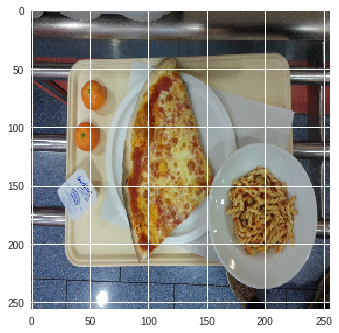

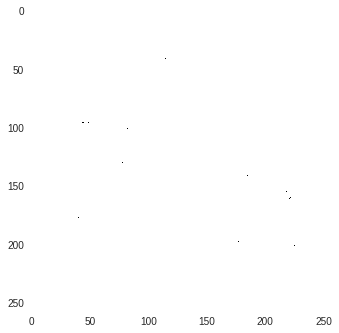

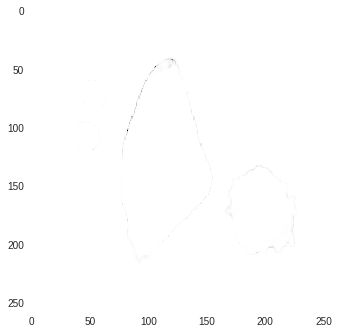

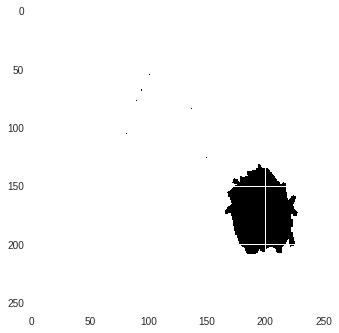

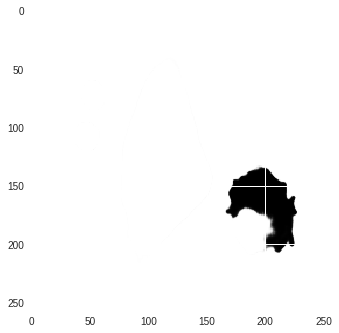

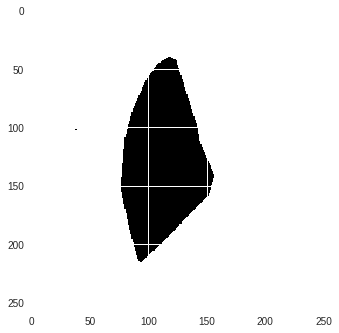

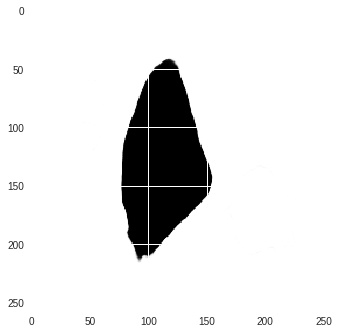

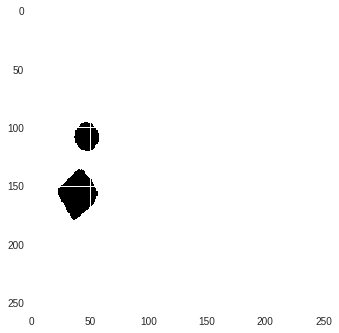

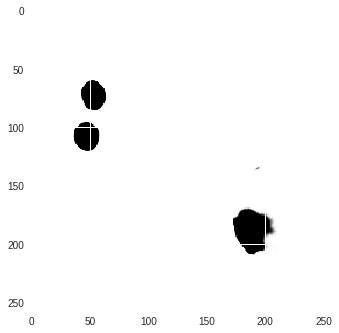

In [24]:
plt.imshow(test_img[0])
plt.show()
for i in range(0,NUM_CLASSES+1):
  test_mask_onehot = test_mask[0,:,:,0] == classes[classes_ids[i]]
  plt.imshow(test_mask_onehot)
  plt.show()
  plt.imshow(Y[0,:,:,i])
  plt.show()

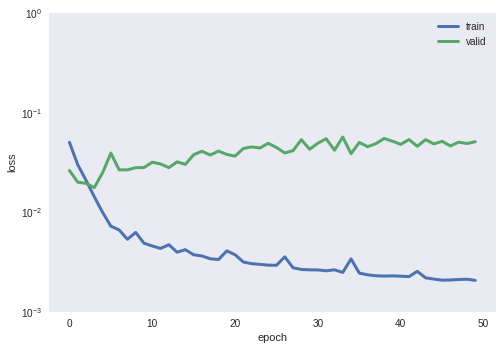

In [25]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(loss, linewidth=3, label='train')
plt.plot(val_loss, linewidth=3, label='valid')
plt.grid()
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.ylim(1e-3, 1)
plt.yscale('log') 
plt.show()

## Results Statistics


### IOU

In [12]:
import os
import random
import sys
import warnings
import numpy as np
import pandas as pd
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from skimage import img_as_bool
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm

In [13]:
def IOU(truth, segm):
  if truth.shape != segm.shape:
    print("Groud truth and segmented image should have the same size.")
    return
  truth = truth/np.max(truth)
  segm = segm/np.max(segm)
  intersection = np.logical_and(truth, segm)
  inter_count = np.sum(intersection)
  union = np.logical_or(truth, segm)
  union_count = np.sum(union)
  iou = inter_count/union_count
  return iou
  
def mean_IOU(truth, segm):
  if truth.shape != segm.shape:
    print("Groud truth and segmented images should have the same size.")
    return
  nb_img = truth.shape[0]
  sum_iou = 0
  for i in range(nb_img):
    sum_iou = sum_iou + IOU(truth[i], segm[i])
  mean_iou = sum_iou/nb_img
  return mean_iou

In [14]:
def segmentation_IOU(url_segm):
  N = len(test_ids)
  n = 256
  m = 256
  original_mask = 'data/segmented_onehot/'
  segmentation_mask = url_segm
  mean_IOU = 0
  for i in tqdm(range(N)):
    img_id = test_ids[i]
    count = 0
    sum_IOU = 0
    for j in range(len(classes_ids)):
      fname = original_mask + img_id + '/' + classes_ids[j] + '.png'
      if os.path.isfile(fname):
        truth = imread(fname, flatten=True)
        truth = resize(truth, (256,256), mode='constant', preserve_range=False)
        segm = imread(segmentation_mask + img_id + '/' + str(j) + '.png')
        count = count+1
        sum_IOU = sum_IOU + IOU(truth, segm)
    sum_IOU = sum_IOU/count
    mean_IOU = mean_IOU+sum_IOU
  mean_IOU = mean_IOU/N
  return mean_IOU

In [15]:
url_segm = 'results_segmentation/results_segmentation/adamax_72/'
segmentation_IOU(url_segm)

100%|██████████| 360/360 [01:53<00:00,  3.17it/s]


0.6520903234827352

### Plot results

In [16]:
def draw_contours(img, mask_, color):
  mask_2 = np.copy(mask_)
  if(mask_2.ndim == 2):
    mask = np.zeros((img.shape[0],img.shape[1],3))
    integer = 1
    if np.max(mask_2) == 1:
      integer = 255
    mask[:,:,0] = mask_2*integer
    mask[:,:,1] = mask_2*integer
    mask[:,:,2] = mask_2*integer
  else:
    mask = mask_2
    
  mask=mask.astype(np.uint8)
  imgray = cv2.cvtColor(mask,cv2.COLOR_BGR2GRAY)
  ret,thresh = cv2.threshold(imgray,127,255,0)
  mask2, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
  
  img2 = cv2.drawContours(img, contours, -1, color, 15)
  
  return img2

def contours_segmentation(img, mask):
  colors = [(230, 25, 75)	, (60, 180, 75), (255, 225, 25), (0, 130, 200), (245, 130, 48), (145, 30, 180), (70, 240, 240)]
  for i in range(mask.shape[2]):
    img = draw_contours(np.copy(img), np.copy(mask[:,:,i]), colors[i])
  return img

def plot_comparison_contours(img_id, url_segm):
  original = 'data/original/' + img_id + '.jpg'
  original_mask = 'data/segmented_onehot/' + img_id
  segmentation = url_segm + img_id
  
  original_img = imread(original)
  n = original_img.shape[0]
  m = original_img.shape[1]
  count = 0
  ids_class = []
  ids_class_num = []
  for i in range(len(classes_ids)):
    fname = original_mask + '/' + classes_ids[i] + '.png'
    if os.path.isfile(fname):
      ids_class.append(fname)
      ids_class_num.append(i)
      count = count+1
  mask_truth = np.zeros((n,m,count))   
  mask_segm = np.zeros((n,m,count))
  for i in range(count):
    truth = imread(ids_class[i])
    segm = imread(segmentation + '/' + str(ids_class_num[i]) + '.png')
    segm = resize(segm, original_img.shape, mode='constant', preserve_range= False)
    segm = segm[:,:,1]
    mask_truth[:,:,i] = truth
    mask_segm[:,:,i] = segm
  
  img_truth = contours_segmentation(original_img, mask_truth)
  img_unet = contours_segmentation(original_img, mask_segm)
#   original_binary = imread(original_binary)
#   unet_binary = imread(unet_binary)
#   unet_binary_res =resize(unet_binary, original_img.shape, mode='constant', preserve_range= False)
#   unet_binary_res = unet_binary_res[:,:,1]

#   img_truth = draw_contours(np.copy(original_img), np.copy(original_binary))
#   img_unet = draw_contours(np.copy(original_img), np.copy(unet_binary_res))

  plt.figure(figsize=(10,15))
  plt.subplot(121),plt.imshow(np.amax(mask_truth, axis=2))
  plt.title('truth'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(np.amax(mask_segm, axis=2))
  plt.title('segm'), plt.xticks([]), plt.yticks([])
  
  plt.figure(figsize=(20,25))
  plt.subplot(131),plt.imshow(original_img)
  plt.title('Original'), plt.xticks([]), plt.yticks([])
  plt.subplot(132),plt.imshow(img_truth)
  plt.title('Ground truth'), plt.xticks([]), plt.yticks([])
  plt.subplot(133),plt.imshow(img_unet)
  plt.title('U-net'), plt.xticks([]), plt.yticks([])

  plt.show()

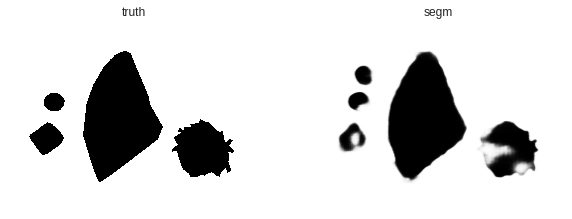

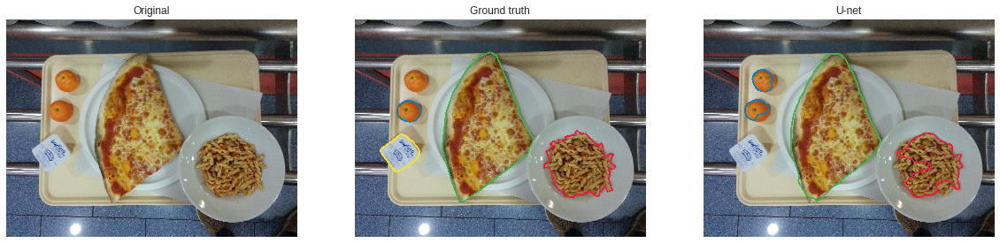

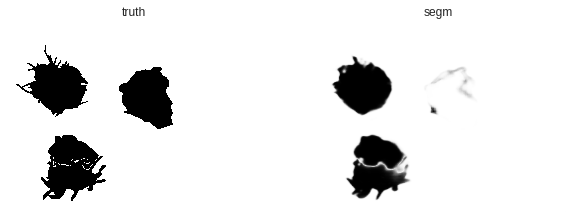

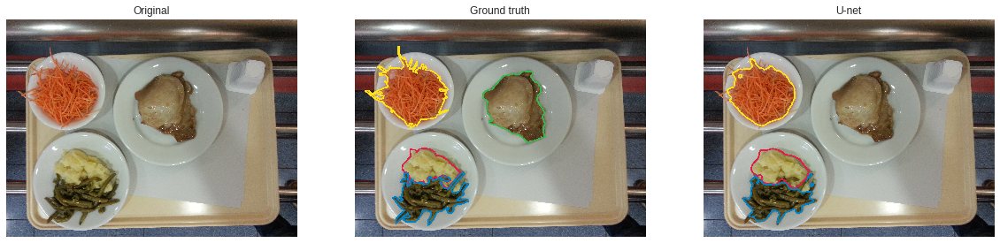

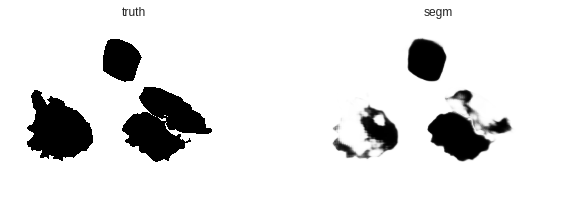

...

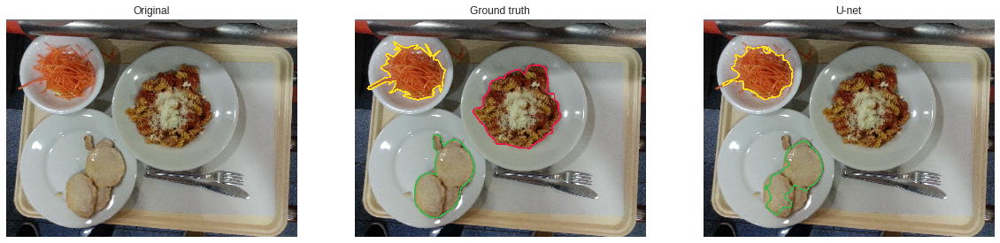

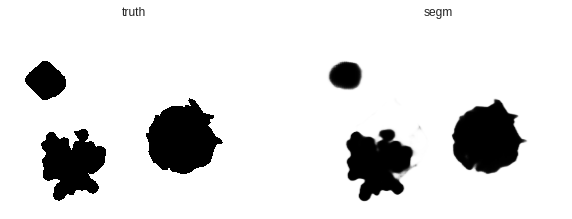

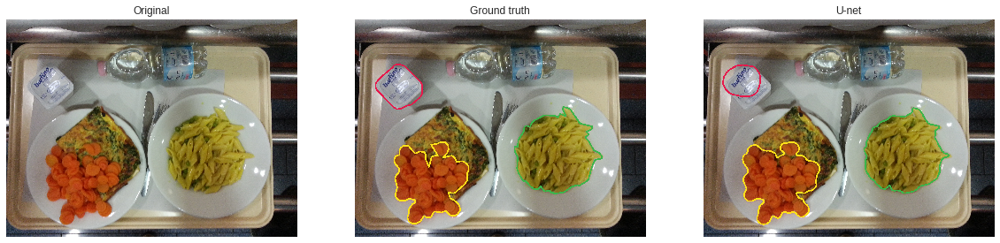

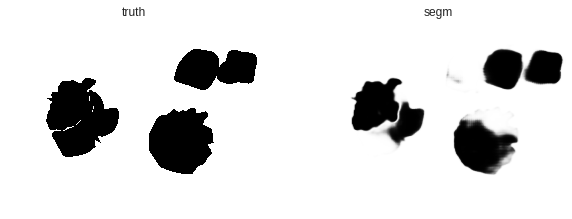

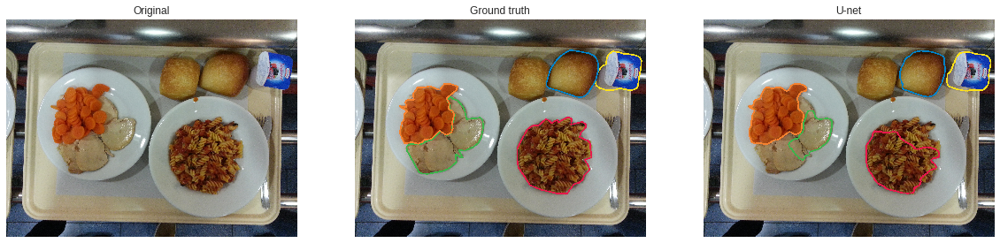

In [17]:
url_segm = 'results_segmentation/results_segmentation/adamax_72/'
i = 30
for img_id in test_ids[:i]:
  plot_comparison_contours(img_id, url_segm)